# Import


In [3]:
import pandas as pd
import re
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_curve,
    auc,
)


import matplotlib.pyplot as plt
import seaborn as sns

import nltk

nltk.download("punkt")
nltk.download("stopwords")
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

from nltk import FreqDist
from wordcloud import WordCloud

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/skanderzahi/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/skanderzahi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
# Configurer l'apparence des graphiques
plt.rcParams.update(
    {
        "figure.facecolor": "#F5F3E8",
        "axes.facecolor": "#F5F3E8",
        "savefig.facecolor": "#F5F3E8",
    }
)

In [7]:
# Définir les noms de colonnes et les types de données
cols = ["target", "id", "date", "query", "user", "text"]


# Charger le fichier CSV
df = pd.read_csv(
    "../dataset/training.1600000.processed.noemoticon.csv",
    encoding="latin-1",
    header=None,
    names=cols,
)

In [7]:
pd.set_option("display.max_colwidth", None)

In [8]:
# Aperçu de 20 individus aléatoires
df.sample(20, random_state=42)

,target,id,date,query,user,text
541200,0,2200003196,Tue Jun 16 18:18:12 PDT 2009,NO_QUERY,LaLaLindsey0609,@chrishasboobs AHHH I HOPE YOUR OK!!!
750,0,1467998485,Mon Apr 06 23:11:14 PDT 2009,NO_QUERY,sexygrneyes,"@misstoriblack cool , i have no tweet apps fo..."
766711,0,2300048954,Tue Jun 23 13:40:11 PDT 2009,NO_QUERY,sammydearr,@TiannaChaos i know just family drama. its la...
285055,0,1993474027,Mon Jun 01 10:26:07 PDT 2009,NO_QUERY,Lamb_Leanne,School email won't open and I have geography ...
705995,0,2256550904,Sat Jun 20 12:56:51 PDT 2009,NO_QUERY,yogicerdito,upper airways problem
379611,0,2052380495,Sat Jun 06 00:32:16 PDT 2009,NO_QUERY,Yengching,Going to miss Pastor's sermon on Faith...
1189018,4,1983449090,Sun May 31 13:10:36 PDT 2009,NO_QUERY,jessig06,on lunch....dj should come eat with me
667030,0,2245479748,Fri Jun 19 16:11:29 PDT 2009,NO_QUERY,felicityfuller,@piginthepoke oh why are you feeling like that?
93541,0,1770705699,Mon May 11 22:01:32 PDT 2009,NO_QUERY,stephiiheyy,gahh noo!peyton needs to live!this is horrible
1097326,4,1970386589,Sat May 30 03:39:34 PDT 2009,NO_QUERY,wyndwitch,@mrstessyman thank you glad you like it! There...


In [9]:
df_copie = df.copy()

# EDA

In [10]:
for col in df.columns:
    print(f"Feature : {col}")
    print(f"Type : {df[col].dtypes}")
    print(f"Nombre de valeurs manquantes : {df[col].isna().sum()}")
    print(f"Nombre de valeurs uniques : {df[col].nunique()}")
    print(f"Nombre de doublons : {df[col][df[col].duplicated()].count()}")
    print("\n---------------\n")

Feature : target
Type : int64
Nombre de valeurs manquantes : 0
Nombre de valeurs uniques : 2
Nombre de doublons : 1599998

---------------

Feature : id
Type : int64
Nombre de valeurs manquantes : 0
Nombre de valeurs uniques : 1598315
Nombre de doublons : 1685

---------------

Feature : date
Type : object
Nombre de valeurs manquantes : 0
Nombre de valeurs uniques : 774363
Nombre de doublons : 825637

---------------

Feature : query
Type : object
Nombre de valeurs manquantes : 0
Nombre de valeurs uniques : 1
Nombre de doublons : 1599999

---------------

Feature : user
Type : object
Nombre de valeurs manquantes : 0
Nombre de valeurs uniques : 659775
Nombre de doublons : 940225

---------------

Feature : text
Type : object
Nombre de valeurs manquantes : 0
Nombre de valeurs uniques : 1581466
Nombre de doublons : 18534

---------------



In [11]:
df["target"].nunique(), df["target"].value_counts()

(2,
 target
 0    800000
 4    800000
 Name: count, dtype: int64)

In [12]:
# Remplacer les valeurs 4 par 1 dans la colonne "target"
df.loc[df["target"] == 4, "target"] = 1
df["target"].value_counts()

target
0    800000
1    800000
Name: count, dtype: int64

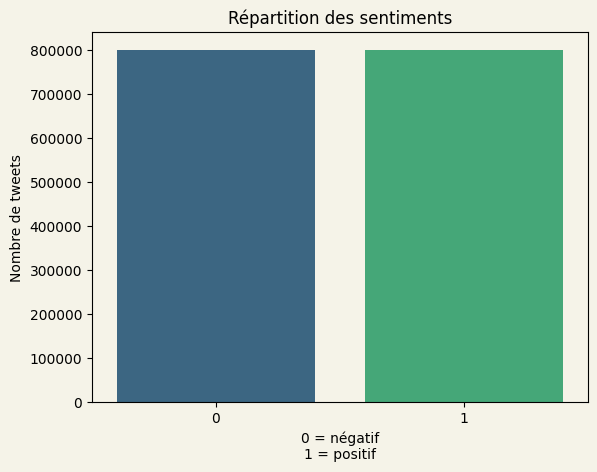

In [13]:
sns.countplot(x="target", data=df, palette="viridis", hue="target", legend=False)
plt.title("Répartition des sentiments")
plt.xlabel("0 = négatif\n1 = positif")
plt.ylabel("Nombre de tweets")
plt.show()

In [14]:
df["target"].value_counts()

target
0    800000
1    800000
Name: count, dtype: int64

In [15]:
df_negatif = df.loc[df["target"] == 0, :].sample(100000, random_state=42)
df_positif = df.loc[df["target"] == 1, :].sample(100000, random_state=42)
df_all = pd.concat([df_negatif, df_positif], axis=0).reset_index(drop=True)

In [16]:
df_all

,target,id,date,query,user,text
0,0,1974671194,Sat May 30 13:36:31 PDT 2009,NO_QUERY,simba98,@xnausikaax oh no! where did u order from? that's horrible
1,0,1997882236,Mon Jun 01 17:37:11 PDT 2009,NO_QUERY,Seve76,A great hard training weekend is over. a couple days of rest and lets do it again! Lots of computer time to put in now
2,0,2177756662,Mon Jun 15 06:39:05 PDT 2009,NO_QUERY,x__claireyy__x,"Right, off to work Only 5 hours to go until I'm free xD"
3,0,2216838047,Wed Jun 17 20:02:12 PDT 2009,NO_QUERY,Balasi,I am craving for japanese food
4,0,1880666283,Fri May 22 02:03:31 PDT 2009,NO_QUERY,djrickdawson,Jean Michel Jarre concert tomorrow gotta work 7-3 before though
...,...,...,...,...,...,...
199995,1,1678756124,Sat May 02 07:38:13 PDT 2009,NO_QUERY,llhinkle,@kimberlykeith Awww thanks That made me feel loved
199996,1,2070127756,Sun Jun 07 17:08:32 PDT 2009,NO_QUERY,markdavidson,@callkathy I just started using this on my iPhone and Tweetie: http://tweetshrink.com/ http://twitter.com/callkathy/status/2070099520
199997,1,1880450522,Fri May 22 01:17:10 PDT 2009,NO_QUERY,thedamo,"@tferriss Hi Tim, what are your thoughts of Buenos Aires? Have you you written anything on it? Will be going there soon"
199998,1,2002418448,Tue Jun 02 04:09:20 PDT 2009,NO_QUERY,patient_warrior,"@pastorjpruitt We have authority over devils (Matt. 10:1) and we are seated with Christ in heavenly places far above (Eph. 1:20, 2:6)."


In [ ]:
lengths = [len(text.split()) for text in df_train["text"]]
import matplotlib.pyplot as plt

plt.hist(lengths, bins=50)
plt.axvline(x=500, color="r", linestyle="--", label="max_length=500")
plt.xlabel("Nombre de mots")
plt.ylabel("Fréquence")
plt.legend()
plt.show()

print(f"Moyenne: {np.mean(lengths):.0f} mots")
print(f"Médiane: {np.median(lengths):.0f} mots")
print(f"Max: {np.max(lengths)} mots")

In [ ]:

import pandas as pd
import numpy as np

# Charger les données
df_train = pd.read_csv("train_100K.csv")

print("=" * 60)
print(" DIAGNOSTIC DES DONNÉES")
print("=" * 60)

# Longueur des textes
text_lengths = df_train["text"].str.len()
word_counts = df_train["text"].str.split().str.len()

print(f"\n LONGUEUR DES TEXTES (caractères):")
print(f"  Moyenne:  {text_lengths.mean():.0f}")
print(f"  Médiane:  {text_lengths.median():.0f}")
print(f"  Max:      {text_lengths.max():.0f}")
print(f"  Min:      {text_lengths.min():.0f}")

print(f"\n NOMBRE DE MOTS:")
print(f"  Moyenne:  {word_counts.mean():.0f}")
print(f"  Médiane:  {word_counts.median():.0f}")
print(f"  Max:      {word_counts.max():.0f}")
print(f"  Min:      {word_counts.min():.0f}")

print(f"\n MÉMOIRE APPROXIMATIVE:")
total_chars = text_lengths.sum()
approx_mb = (total_chars * 2) / (1024 * 1024)  # 2 bytes par char (unicode)
print(f"  Textes bruts: ~{approx_mb:.1f} MB")

# Voir quelques exemples
print(f"\n EXEMPLES DE TEXTES:")
for i in range(min(3, len(df_train))):
    text = df_train["text"].iloc[i]
    print(f"\n  [{i+1}] Longueur: {len(text)} chars, {len(text.split())} mots")
    print(f"      Extrait: {text[:200]}...")


# test tokenisation

In [17]:
# Test TweetTokenizer

tweet = "@neuralink lit les pensées. @ChuckNorris les ÉCRIT!!!!! Hein @elonmusk #ChuckNorris;)"

# Tokenizer standard
from nltk.tokenize import word_tokenize

print("Standard:", word_tokenize(tweet))

# TweetTokenizer
from nltk.tokenize import TweetTokenizer

tknzr = TweetTokenizer()
print("TweetTokenizer:", tknzr.tokenize(tweet))

Standard: ['@', 'neuralink', 'lit', 'les', 'pensées', '.', '@', 'ChuckNorris', 'les', 'ÉCRIT', '!', '!', '!', '!', '!', 'Hein', '@', 'elonmusk', '#', 'ChuckNorris', ';', ')']
TweetTokenizer: ['@neuralink', 'lit', 'les', 'pensées', '.', '@ChuckNorris', 'les', 'ÉCRIT', '!', '!', '!', 'Hein', '@elonmusk', '#ChuckNorris', ';)']


In [ ]:
# Comparaison des deux tokenizers
def wordTokenize(text):
    return word_tokenize(text)


def tweetTokenize(text):
    tweet_tokenizer = TweetTokenizer(
        preserve_case=False,  # uniformisation en minuscules
        reduce_len=True,  # réduit les répétitions de caractères
        strip_handles=False,  # conserve les @mentions
    )
    tokens = tweet_tokenizer.tokenize(text)
    return tokens

In [19]:
for text in df["text"].sample(10, random_state=42):

    print("Texte original:", text)

    # Tokenizer standard
    from nltk.tokenize import word_tokenize

    print("Standard:", wordTokenize(text))

    # TweetTokenizer

    print("TweetTokenizer:", tweetTokenize(text))
    print("\n")

Texte original: @chrishasboobs AHHH I HOPE YOUR OK!!! 
Standard: ['@', 'chrishasboobs', 'AHHH', 'I', 'HOPE', 'YOUR', 'OK', '!', '!', '!']
TweetTokenizer: ['@chrishasboobs', 'ahhh', 'i', 'hope', 'your', 'ok', '!', '!', '!']


Texte original: @misstoriblack cool , i have no tweet apps  for my razr 2
Standard: ['@', 'misstoriblack', 'cool', ',', 'i', 'have', 'no', 'tweet', 'apps', 'for', 'my', 'razr', '2']
TweetTokenizer: ['@misstoriblack', 'cool', ',', 'i', 'have', 'no', 'tweet', 'apps', 'for', 'my', 'razr', '2']


Texte original: @TiannaChaos i know  just family drama. its lame.hey next time u hang out with kim n u guys like have a sleepover or whatever, ill call u
Standard: ['@', 'TiannaChaos', 'i', 'know', 'just', 'family', 'drama', '.', 'its', 'lame.hey', 'next', 'time', 'u', 'hang', 'out', 'with', 'kim', 'n', 'u', 'guys', 'like', 'have', 'a', 'sleepover', 'or', 'whatever', ',', 'ill', 'call', 'u']
TweetTokenizer: ['@tiannachaos', 'i', 'know', 'just', 'family', 'drama', '.', 'its', '

=> TweetTokenizer
conserve # et @
Préserve la négation
Conserve les emoticones

In [20]:
def word_frequency(text, sentiment):

    # Fusionner tous les tweets en un seul corpus
    corpus = " ".join(text)

    # TweetTokenizer
    tokens = tweetTokenize(corpus)

    # nbr de mots, nbr de mot unique
    print(
        f"Nombre total de mots : {len(tokens)}\n Nombre de mots uniques : {len(set(tokens))}"
    )

    # frequence de chaque mot
    tokens_frequency = FreqDist(tokens)
    tokens_frequency_serie = pd.Series(tokens_frequency).sort_values(ascending=False)
    plt.figure(figsize=(15, 5))
    sns.barplot(
        x=(tokens_frequency_serie.sort_values(ascending=False).head(25).index),
        y=(tokens_frequency_serie.sort_values(ascending=False).head(25).values),
        palette="viridis",
    )
    plt.title(f"25 mots les plus fréquents sentiment {sentiment}")
    plt.xticks(rotation=80)
    plt.show()

    # Nuage de mots
    wordcloud = WordCloud(background_color="white", max_words=50).generate(corpus)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(f"WordCloud - 50 mots les plus fréquents sentiment {sentiment}")
    plt.show()

    return tokens, corpus

Nombre total de mots : 1561683
 Nombre de mots uniques : 90727


/var/folders/3g/rdq178bx3690jwjlb35tlzqw0000gp/T/ipykernel_1543/2982561906.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


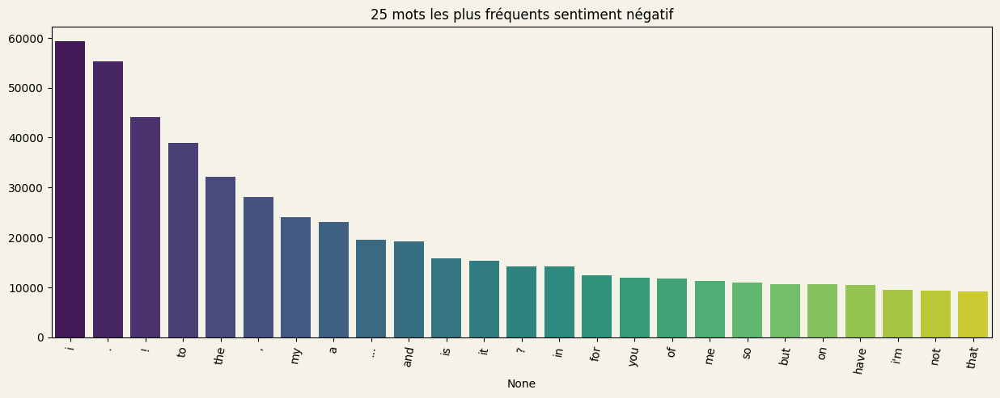

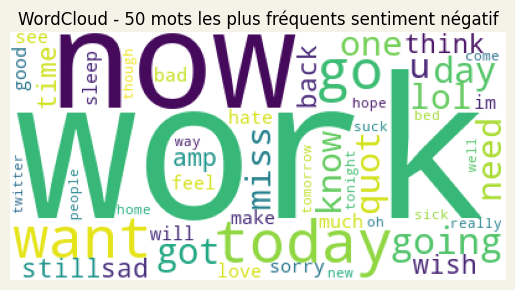

(['@xnausikaax',
  'oh',
  'no',
  '!',
  'where',
  'did',
  'u',
  'order',
  'from',
  '?',
  "that's",
  'horrible',
  'a',
  'great',
  'hard',
  'training',
  'weekend',
  'is',
  'over',
  '.',
  'a',
  'couple',
  'days',
  'of',
  'rest',
  'and',
  'lets',
  'do',
  'it',
  'again',
  '!',
  'lots',
  'of',
  'computer',
  'time',
  'to',
  'put',
  'in',
  'now',
  'right',
  ',',
  'off',
  'to',
  'work',
  'only',
  '5',
  'hours',
  'to',
  'go',
  'until',
  "i'm",
  'free',
  'xd',
  'i',
  'am',
  'craving',
  'for',
  'japanese',
  'food',
  'jean',
  'michel',
  'jarre',
  'concert',
  'tomorrow',
  'gotta',
  'work',
  '7-3',
  'before',
  'though',
  '@xpowxbangxboomx',
  'dammiitt',
  '!',
  '!',
  'i',
  'wish',
  'i',
  'had',
  'mtv',
  '@rohan_01',
  'you',
  'know',
  '..',
  "it's",
  'really',
  'sad',
  'that',
  'u',
  'know',
  'that',
  'ur',
  'classmate',
  "don't",
  'care',
  'about',
  'you',
  '..',
  'sad',
  'memories',
  't',
  '.',
  't',
  '

In [21]:
word_frequency(df_negatif["text"], sentiment="négatif")

Nombre total de mots : 1497475
 Nombre de mots uniques : 109751


/var/folders/3g/rdq178bx3690jwjlb35tlzqw0000gp/T/ipykernel_1543/2982561906.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


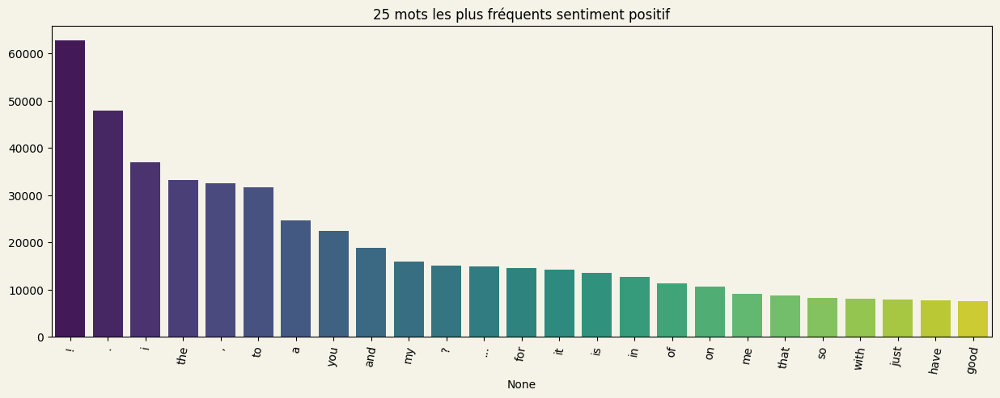

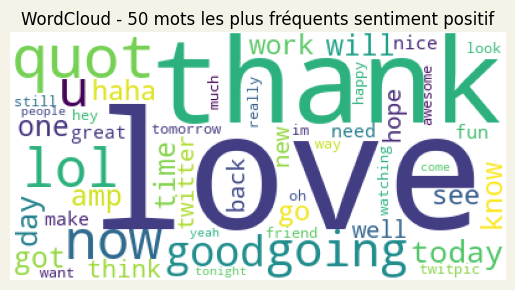

(['is',
  'lookin',
  '4ward',
  'to',
  'a',
  'long',
  'weekend',
  'really',
  'dont',
  'want',
  'to',
  'go',
  'to',
  'work',
  '2day',
  'tho',
  '=[',
  'x',
  '#myweakness',
  'is',
  'music',
  'and',
  'i',
  'live',
  'to',
  'meet',
  'the',
  'people',
  'who',
  'make',
  'it',
  'figured',
  'out',
  'the',
  'internet',
  'on',
  'my',
  'new',
  'ipod',
  '@hillsongunited',
  "can't",
  'wait',
  'to',
  'worship',
  'with',
  'you',
  'guys',
  'tonight',
  '.',
  "it'll",
  'be',
  'so',
  'much',
  'fun',
  '@sillybeggar',
  'congrats',
  'james',
  '!',
  '!',
  "i'm",
  'sure',
  'the',
  'book',
  'is',
  'going',
  'to',
  'be',
  'a',
  'huge',
  'success',
  '@debbybruck',
  'beautiful',
  '!',
  'when',
  'children',
  'smile',
  'the',
  'world',
  'smiles',
  '@bethofalltrades',
  'http://twitpic.com/69bs9',
  '-',
  'happy',
  'birthday',
  '!',
  '@ad_infinitum',
  'why',
  'yes',
  ',',
  'i',
  'can',
  '.',
  'the',
  'ultimate',
  'vegan',
  'guid

In [22]:
word_frequency(df_positif["text"], sentiment="positif")

In [23]:
df_all

,target,id,date,query,user,text
0,0,1974671194,Sat May 30 13:36:31 PDT 2009,NO_QUERY,simba98,@xnausikaax oh no! where did u order from? that's horrible
1,0,1997882236,Mon Jun 01 17:37:11 PDT 2009,NO_QUERY,Seve76,A great hard training weekend is over. a couple days of rest and lets do it again! Lots of computer time to put in now
2,0,2177756662,Mon Jun 15 06:39:05 PDT 2009,NO_QUERY,x__claireyy__x,"Right, off to work Only 5 hours to go until I'm free xD"
3,0,2216838047,Wed Jun 17 20:02:12 PDT 2009,NO_QUERY,Balasi,I am craving for japanese food
4,0,1880666283,Fri May 22 02:03:31 PDT 2009,NO_QUERY,djrickdawson,Jean Michel Jarre concert tomorrow gotta work 7-3 before though
...,...,...,...,...,...,...
199995,1,1678756124,Sat May 02 07:38:13 PDT 2009,NO_QUERY,llhinkle,@kimberlykeith Awww thanks That made me feel loved
199996,1,2070127756,Sun Jun 07 17:08:32 PDT 2009,NO_QUERY,markdavidson,@callkathy I just started using this on my iPhone and Tweetie: http://tweetshrink.com/ http://twitter.com/callkathy/status/2070099520
199997,1,1880450522,Fri May 22 01:17:10 PDT 2009,NO_QUERY,thedamo,"@tferriss Hi Tim, what are your thoughts of Buenos Aires? Have you you written anything on it? Will be going there soon"
199998,1,2002418448,Tue Jun 02 04:09:20 PDT 2009,NO_QUERY,patient_warrior,"@pastorjpruitt We have authority over devils (Matt. 10:1) and we are seated with Christ in heavenly places far above (Eph. 1:20, 2:6)."


=== ANALYSE DES MENTIONS @ ===
Mentions négatives: 40274 total, 32542 uniques
Mentions positives: 59508 total, 44636 uniques

Top 5 mentions négatives: [('@', 749), ('@tommcfly', 237), ('@mileycyrus', 172), ('@ddlovato', 145), ('@jonasbrothers', 100)]
Top 5 mentions positives: [('@', 681), ('@mileycyrus', 355), ('@tommcfly', 288), ('@ddlovato', 264), ('@jonasbrothers', 231)]


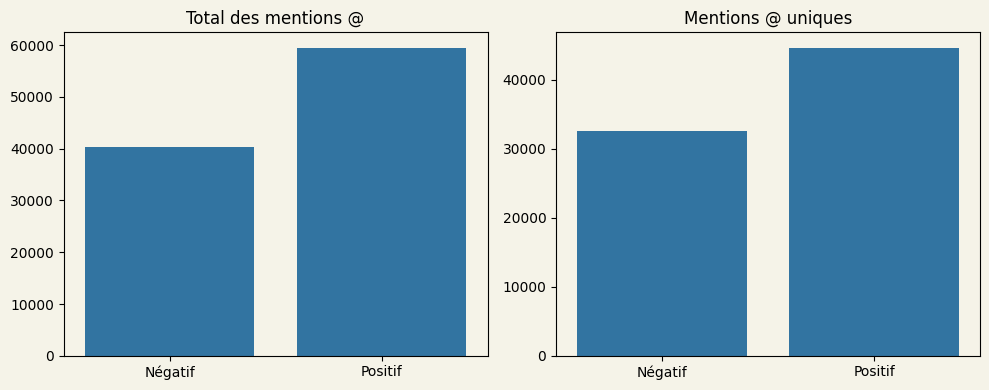

In [24]:
def analyze_mentions(df_neg, df_pos):
    """
    Analyse comparative des mentions @ entre tweets positifs et négatifs
    """
    print("=== ANALYSE DES MENTIONS @ ===")

    def get_mentions_from_series(text_series):
        """Extrait toutes les mentions d'une série de textes"""
        all_mentions = []
        for text in text_series:
            tokens = tweetTokenize(text)
            # Filtrer les tokens qui commencent par @
            mentions = [token for token in tokens if token.startswith("@")]
            all_mentions.extend(mentions)
        return all_mentions

    # Extraire les mentions pour chaque sentiment
    mentions_neg = get_mentions_from_series(df_neg["text"])
    mentions_pos = get_mentions_from_series(df_pos["text"])

    # Affichage des statistiques
    print(
        f"Mentions négatives: {len(mentions_neg)} total, {len(set(mentions_neg))} uniques"
    )
    print(
        f"Mentions positives: {len(mentions_pos)} total, {len(set(mentions_pos))} uniques"
    )

    # Top mentions par sentiment
    print("\nTop 5 mentions négatives:", Counter(mentions_neg).most_common(5))
    print("Top 5 mentions positives:", Counter(mentions_pos).most_common(5))

    # Visualisation
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    sns.barplot(x=["Négatif", "Positif"], y=[len(mentions_neg), len(mentions_pos)])
    plt.title("Total des mentions @")

    plt.subplot(1, 2, 2)
    sns.barplot(
        x=["Négatif", "Positif"], y=[len(set(mentions_neg)), len(set(mentions_pos))]
    )
    plt.title("Mentions @ uniques")

    plt.tight_layout()
    plt.show()

    return mentions_neg, mentions_pos


# Application
mentions_neg, mentions_pos = analyze_mentions(df_negatif, df_positif)

# Split data


In [26]:
# Séparer les données en ensembles d'entraînement et de test
df_train, df_test = train_test_split(
    df_all,
    test_size=0.2,
    random_state=42,
    stratify=df_all["target"],
)

In [27]:
# sauvegarder les datasets
# df_train.to_csv("df_train.csv", index=False)
# df_test.to_csv("df_test.csv", index=False)
print(f"df_train: {df_train.shape}")
print(f"df_test: {df_test.shape}")

df_train: (160000, 6)
df_test: (40000, 6)
